In [1]:
import pandas as pd
import re
import numpy as np
import glob
import os
from collections import defaultdict
import networkx
from networkx.algorithms.components.connected import connected_components
from packages import npomix
import time
from datetime import datetime
from sklearn.metrics import jaccard_score
import matplotlib.pyplot as plt

In [2]:
start = time.time()

In [3]:
edges_path = "./inputs/gnps_function/ProteoSAFe-METABOLOMICS-SNETS-V2-67f55c7d-download_cytoscape_data/bfcbd4d8e55c43e99283bb029c4bad89..selfloop"
nodes_path = "./inputs/gnps_function/ProteoSAFe-METABOLOMICS-SNETS-V2-67f55c7d-download_cytoscape_data/c985e9c2abe94283828bd01c94645a29.clustersummary"

In [4]:
nodes_df = pd.read_csv(nodes_path,sep='\t')

nodes_df[:5]

,AllGroups,DefaultGroups,EvenOdd,G1,G2,G3,G4,G5,G6,GNPSLinkout_Cluster,...,SpectrumID,UniqueFileSources,UniqueFileSourcesCount,cluster index,componentindex,number of spectra,parent mass,precursor charge,precursor mass,sum(precursor intensity)
0,,G1,1,8,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bact_vulg_CL09T03C04_V1.3.mzXML|Bact_sp_9_1_42...,7,2,-1,8,84.043,0,84.043,12004.0
1,,G1,1,14,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bacteroides_sp_1_1_30_V1.3.mzXML|Clos_bact_OBR...,12,4,-1,14,84.043,0,84.043,23389.0
2,,G1,1,20,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bacteroides_sp_1_1_30_V1.3.mzXML|Bact_sp_1_1_6...,12,6,1846,20,84.044,0,84.044,46212.0
3,,G1,1,16,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bacteroides_sp_1_1_30_V1.3.mzXML|Bact_sp_1_1_6...,13,11,1846,16,84.043,0,84.043,37704.0
4,,G1,1,6,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bact_thet_CL09T03C10_V1.3.mzXML|Bacteroides_sp...,4,35,-1,6,84.043,0,84.043,12097.0


In [5]:
clusterindex_list = []

for i,r in nodes_df.iterrows():
    if type(r['LibraryID']) != float:
#     if r['LibraryID'] in ['Daidzein','Simvastatin backbone ion']:
        clusterindex_list.append(r['cluster index'])
        
clusterindex_list

[7218,
 7270,
 11268,
 11274,
 11297,
 12849,
 12850,
 12859,
 13179,
 13291,
 13392,
 14846,
 15247,
 15279,
 15546,
 17645,
 17957,
 17958,
 18577,
 18767,
 21372,
 25673,
 25697,
 25796,
 26090,
 26108,
 26241,
 26366,
 26376,
 26385,
 27404,
 27728,
 27734,
 27742,
 27772,
 27873,
 27900,
 28240,
 28245,
 28270,
 28282,
 28310,
 28368,
 28378,
 28380,
 28383,
 28385,
 28514,
 28591,
 29445,
 29551,
 29554,
 29648,
 31135,
 31183,
 31563,
 31605,
 31607,
 31632,
 31671,
 32406,
 32451,
 32575,
 32766,
 33492,
 33618,
 33623,
 33705,
 34282,
 34345,
 34408,
 34861,
 38623,
 38660,
 38666,
 38668,
 39057,
 39061,
 40059,
 40074,
 40119,
 40303,
 40516,
 41280,
 42729,
 45221,
 45224,
 45235,
 46523,
 47104,
 48284,
 48602,
 48603,
 48610,
 48767,
 51668,
 51696,
 51708,
 52756,
 53134,
 53147,
 53254,
 53277,
 53307,
 53613,
 53654,
 53658,
 53693,
 53702,
 53743,
 53762,
 53773,
 53785,
 53947,
 54115,
 54340,
 54474,
 54835,
 55519,
 56883,
 56886,
 56983,
 57118,
 60657,
 60739,
 6

In [6]:
edges_df = pd.read_csv(edges_path,sep='\t')

def get_neighbors(target,dataframe,column1,column2):
    subset1 = dataframe[(dataframe[column1]==target)]
    subcat = subset1.append(dataframe[(dataframe[column2]==target)])
    temp_list = []
    for index,row in subcat.iterrows():
        temp_list.append(subcat[column1][index])
        temp_list.append(subcat[column2][index])
    temp_list = list(np.unique(temp_list))
    return temp_list

def to_edges(l):
    it = iter(l)
    last = next(it)
    for current in it:
        yield last, current
        last = current

def to_graph(l):
    G = networkx.Graph()
    for part in l:
        G.add_nodes_from(part)
        G.add_edges_from(to_edges(part))
    return G

def get_family_dict(components_list,dataframe,dictionary,column1,column2,column3):
    count = 0
    for family in list(components_list):
        count += 1
        for fam_member in family:
            dictionary['MF%s'%count].append(fam_member)
    return dictionary

def main_get_families(gnps_df):
    targets_list = np.unique([gnps_df.CLUSTERID1,gnps_df.CLUSTERID2])
    neighbors_list = []
    for target in targets_list:
        neighbors_list.append(get_neighbors(target,gnps_df,'CLUSTERID1','CLUSTERID2'))
    G = to_graph(neighbors_list)
    C = connected_components(G)
    mf_dict = defaultdict(list)
    mf_dict = get_family_dict(C,gnps_df,mf_dict,'CLUSTERID1','CLUSTERID2','Cosine')
    return mf_dict

mf_dict = main_get_families(edges_df)

mf_dict

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_83981/2825894952.py:5: FutureWarn

defaultdict(list,
            {'MF1': [2],
             'MF2': [4],
             'MF3': [6434,
              4068,
              13445,
              6,
              61689,
              5640,
              2060188,
              11,
              61648,
              3890,
              82035,
              17780,
              17788,
              5625,
              3868],
             'MF4': [35],
             'MF5': [734],
             'MF6': [741],
             'MF7': [742],
             'MF8': [3867, 745, 3355],
             'MF9': [1149],
             'MF10': [14875, 3315],
             'MF11': [3343],
             'MF12': [5181, 3397],
             'MF13': [3695],
             'MF14': [3704],
             'MF15': [7411, 3812, 7412, 7407],
             'MF16': [3988],
             'MF17': [4609],
             'MF18': [15552, 15585, 5012, 25748, 15546],
             'MF19': [5161],
             'MF20': [5297, 5197, 5183],
             'MF21': [5224],
             'MF22': [5303]

In [7]:
for ion in clusterindex_list:
    print(ion)

7218
7270
11268
11274
11297
12849
12850
12859
13179
13291
13392
14846
15247
15279
15546
17645
17957
17958
18577
18767
21372
25673
25697
25796
26090
26108
26241
26366
26376
26385
27404
27728
27734
27742
27772
27873
27900
28240
28245
28270
28282
28310
28368
28378
28380
28383
28385
28514
28591
29445
29551
29554
29648
31135
31183
31563
31605
31607
31632
31671
32406
32451
32575
32766
33492
33618
33623
33705
34282
34345
34408
34861
38623
38660
38666
38668
39057
39061
40059
40074
40119
40303
40516
41280
42729
45221
45224
45235
46523
47104
48284
48602
48603
48610
48767
51668
51696
51708
52756
53134
53147
53254
53277
53307
53613
53654
53658
53693
53702
53743
53762
53773
53785
53947
54115
54340
54474
54835
55519
56883
56886
56983
57118
60657
60739
61645
61724
65814
65834
66538
66554
66825
68060
68110
69849
69851
69875
69887
70419
76907
76909
76912
76926
76929
76930
77108
77217
77345
77401
77526
77766
77801
77806
77820
77827
77831
77843
77845
77846
77852
77854
77861
77863
77872
77881
77890
77895


In [8]:
lcms_file_list = []

for item in nodes_df['UniqueFileSources']:
    for lcms_file in item.split('|'):
        if lcms_file not in lcms_file_list:
            print(lcms_file)
            lcms_file_list.append(lcms_file)

Bact_vulg_CL09T03C04_V1.3.mzXML
Bact_sp_9_1_42FAA_V2.3.mzXML
Blongum44Bv1.3.mzXML
SspCM7v1.2.mzXML
Clos_clos_2_1_49FAA_V1.3.mzXML
SspSR1v1.2.mzXML
Clos_orbi_1_3_50AFAA_V1.3.mzXML
Bacteroides_sp_1_1_30_V1.3.mzXML
Clos_bact_OBRC5-5_V1.2.mzXML
SspOBRC6v1.2.mzXML
Bact_frag_CL07T12C05_V1.3.mzXML
Bact_cacc_CL03T12C61_V1.3.mzXML
SspCM6v1.2.mzXML
Para_merd_CL03T12C32_V1.3.mzXML
Bact_dore_CL02T00C15_V1.3.mzXML
Bact_sp_1_1_6_V2.3.mzXML
Bact_cell_CL02T12C19_V1.3.mzXML
Bact_frag_CL07T00C01_V1.3.mzXML
Bact_ster_CC31F_V1.3.mzXML
Acti_vis_C505_V3.3.mzXML
Bact_thet_CL09T03C10_V1.3.mzXML
GCA_000012265.2.mzXML
GCA_000012265.1.mzXML
GCA_000506385.2.mzXML
GCA_003324555.1.mzXML
GCA_001562525.1.mzXML
GCA_001562525.2.mzXML
GCA_000506385.4.mzXML
GCA_003324555.2.mzXML
Blongum35Bv1.3.mzXML
Bact_dore_CL02T12C06_V1.3.mzXML
Bifi_brev_HPH0326_V1.3.mzXML
SspBS29av1.2.mzXML
Bact_frag_CL03T12C07_V1.3.mzXML
ERX2291258.1.mzXML
ERX2291921.1.mzXML
ERX2291789.1.mzXML
BspMSTE12v1.3.mzXML
B111.4.mzML
7961.3.mzML
M92.1.mzML
M

ERS4341427.1.mzXML
ERS4341411.1.mzXML
NJCW00000000.1.mzXML
ERS4341519.1.mzXML
ERS4346496.1.mzXML
ERS4341583.1.mzXML
CENA410.1.mzXML
CENA410.2.mzXML
CENA410.3.mzXML
B1034.2.mzXML
B1034.3.mzXML
B1034.4.mzXML
2845467531.1.mzXML
GCA_009711965.1.mzML
GCA_000521175.2.mzML
GCA_000332075.1.mzML
GCA_009711965.2.mzML
GCA_000317555.1.mzML
GCA_009712035.1.mzML
GCA_000204075.1.mzML
GCA_000521175.1.mzML
GCA_009712035.2.mzML
GCA_000204075.2.mzML
CENA392.1.mzXML
CENA392.3.mzXML
Stach220.1.mzXML
2740891881.1.mzXML
GCA_000170895.1.mzXML
Kleb_pneu_WGLW2_V1.2.mzXML
CCIBT3214.1.mzXML
CCIBT3214.3.mzXML
CENA392.2.mzXML
CCIBT3214.2.mzXML
GCA_011290345.2.mzXML
GCA_002368075.2.mzML
GCA_000010625.2.mzML
GCA_009711925.2.mzML
GCA_002368075.1.mzML
GCA_009711925.1.mzML
GCA_000010625.1.mzML
GCA_002095975.1.mzML
GCA_001625105.2.mzXML
NSQ1003.1.mzML
GCA_010692345.1.mzXML
GCA_002941025.1.mzML
GCA_011290345.3.mzXML
GCA_011290345.1.mzXML
GCA_002994615.4.mzXML
GCA_010692305.1.mzXML
GCA_009711985.1.mzML
GCA_001578075.2.mzML

GCA_000377965.12.mzXML
2548876909.1.mzXML
GCA_000515055.4.mzXML
GCA_000739105.4.mzXML
2518285561.2.mzXML
2518285561.1.mzXML
2548876909.3.mzXML
GCA_000377165.3.mzXML
GCA_000203835.8.mzXML
2518285562.18.mzXML
GCA_000377965.17.mzXML
GCA_000424965.6.mzXML
GCA_000377965.20.mzXML
GCA_002994635.5.mzXML
GCA_002994635.6.mzXML
GCA_000156435.5.mzXML
GCA_001942495.1.mzXML
GCA_000240165.12.mzXML
GCA_000377965.11.mzXML
2518285562.1.mzXML
2528311034.2.mzXML
2517572194.2.mzXML
2518285562.2.mzXML
2517572194.1.mzXML
2516493032.1.mzXML
2524614807.1.mzXML
2516493032.2.mzXML
2528311034.1.mzXML
2524614807.2.mzXML
ISB8A.1.mzML
GCA_001854205.1.mzXML
GCA_000087965.10.mzXML
GCA_000087965.4.mzXML
GCA_000087965.7.mzXML
GCA_000087965.5.mzXML
GCA_000087965.3.mzXML
GCA_000087965.2.mzXML
GCA_000087965.8.mzXML
GCA_000087965.9.mzXML
GCA_000087965.6.mzXML
GCA_000087965.1.mzXML
GCA_000377145.7.mzXML
2517434008.3.mzXML


In [9]:
len(lcms_file_list)

3240

In [10]:
def get_presence_files(nodes_df):
    for unique_list in list(nodes_df[nodes_df['cluster index'] == ion]['UniqueFileSources']):
        return list(unique_list.split('|'))

all_rows_list,testing_indexes_list = [],[]
for ion in clusterindex_list:
    subset_edges = edges_df[(edges_df.CLUSTERID1 == ion) | (edges_df.CLUSTERID2 == ion)]
    cosine = round(max(subset_edges['Cosine']),2)
    presence_list = get_presence_files(nodes_df)
    single_row_list = []
    for lcms_file in lcms_file_list:
        if lcms_file in presence_list:
            single_row_list.append(cosine)
        else:
            single_row_list.append(0)
    all_rows_list.append(single_row_list)
    testing_indexes_list.append(ion)
    
all_rows_list

pre_testing_df = pd.DataFrame(all_rows_list,index=testing_indexes_list,columns=lcms_file_list)

pre_testing_df

,Bact_vulg_CL09T03C04_V1.3.mzXML,Bact_sp_9_1_42FAA_V2.3.mzXML,Blongum44Bv1.3.mzXML,SspCM7v1.2.mzXML,Clos_clos_2_1_49FAA_V1.3.mzXML,SspSR1v1.2.mzXML,Clos_orbi_1_3_50AFAA_V1.3.mzXML,Bacteroides_sp_1_1_30_V1.3.mzXML,Clos_bact_OBRC5-5_V1.2.mzXML,SspOBRC6v1.2.mzXML,...,GCA_000087965.7.mzXML,GCA_000087965.5.mzXML,GCA_000087965.3.mzXML,GCA_000087965.2.mzXML,GCA_000087965.8.mzXML,GCA_000087965.9.mzXML,GCA_000087965.6.mzXML,GCA_000087965.1.mzXML,GCA_000377145.7.mzXML,2517434008.3.mzXML
7218,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7270,0.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
11268,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
11274,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
11297,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2570715,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2571139,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2572345,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2573270,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [11]:
def get_final_df(training_df,testing_df,neighbors_array,results_folder):
    final_df = pd.DataFrame(columns=('metabolite_ID','predicted_GCFs','max_jaccard','parent_mass','sum_intensity'))
    for i,ccms_id in enumerate(testing_df.index):
        jaccard_scores = []
        for j in range(0,len(neighbors_array[i])):
            query_bgc = neighbors_array[i][j]
            bgc_fp = training_df[training_df['label'] == query_bgc].iloc[0]
            bgc_fp = bgc_fp.drop("label")
            ms_fp = testing_df.loc[ccms_id]
            bgc_binary = npomix.get_binary(bgc_fp)
            ms_binary = npomix.get_binary(ms_fp)
            jaccard_scores.append(jaccard_score(bgc_binary,ms_binary))
        max_jaccard = round(max(jaccard_scores),2)
        parentmass = nodes_df[nodes_df['cluster index'] == ccms_id]['precursor mass'].item()
        intensity = nodes_df[nodes_df['cluster index'] == ccms_id]['sum(precursor intensity)'].item()
        final_df.loc[i] = ccms_id,neighbors_array[i],max_jaccard,parentmass,intensity
#     final_df.to_csv("%sfinal_df-derep-NPOmix1.0-%s.txt"%(results_folder,current_date),sep="\t",index_label=False)
    return final_df

In [12]:
ena_df_file = "./ena_dict-210315.csv"
input_bigscape_net = "./bigscape_all_c030.txt"
antismash_folder = "./test/antismash_only_gbk/"
results_folder = "./workshop_results_validation/"

current_date = datetime.today().strftime('%Y%m%d')

if not os.path.isdir(results_folder):
    os.mkdir(results_folder)

k_value = 3

merged_ispec_mat = npomix.get_merged_ispec_mat(pre_testing_df)
merged_ispec_mat = npomix.renaming_merged_ispec_mat(ena_df_file,merged_ispec_mat)
print('Obtaining BiG-SCAPE dataframe and BiG-SCAPE dictionary')
bigscape_df,bigscape_dict = npomix.get_bigscape_df(ena_df_file,input_bigscape_net)
bigscape_df,bigscape_dict2 = npomix.rename_bigscape_df(antismash_folder,bigscape_df,bigscape_dict)
print('BiG-SCAPE create with %s GCFs'%len(bigscape_dict))
strain_list,bgcs_list = npomix.get_strain_list(bigscape_df)
print('Creating training dataframe')
affinity_df,affinity_bgcs = npomix.get_pre_training_df(bigscape_df,bigscape_dict2,strain_list,bgcs_list)
affinity_df = npomix.renaming_affinity_df(affinity_df)
networked_cols = npomix.get_networked_cols(merged_ispec_mat,affinity_df)
training_df,training_bgcs = npomix.get_training_df(affinity_df,networked_cols,results_folder,affinity_bgcs)
bgcs_df = pd.DataFrame(training_bgcs, columns=['bgcs'])
testing_df = npomix.get_testing_df(merged_ispec_mat,networked_cols,results_folder)
print('Running KNN using k equals to %s'%k_value)
neighbors_array = npomix.running_knn(training_df,testing_df,k_value)
print('Creating final dataframe')
final_df = get_final_df(training_df,testing_df,neighbors_array,results_folder)

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

Obtaining BiG-SCAPE dataframe and BiG-SCAPE dictionary


/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

BiG-SCAPE create with 997 GCFs
Creating training dataframe
Running KNN using k equals to 3


/home/tfleao/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['str', 'str_']. An error will be raised in 1.2.
  warnings.warn(
/home/tfleao/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but NearestNeighbors was fitted without feature names
  warnings.warn(


Creating final dataframe


In [13]:
final_df = final_df[final_df['max_jaccard'] > 0]
final_df = final_df.sort_values(by='max_jaccard',ascending=False)
final_df = final_df.reset_index(drop=True)

final_df

,metabolite_ID,predicted_GCFs,max_jaccard,parent_mass,sum_intensity
0,2592191,"[GCF484, GCF484, GCF209]",1.00,1776.850,0.0
1,616296,"[GCF362, GCF362, GCF363]",1.00,280.118,0.0
2,1228345,"[GCF445, GCF439, GCF439]",1.00,388.075,0.0
3,214592,"[GCF22, GCF8, GCF6]",1.00,213.184,0.0
4,214087,"[GCF22, GCF8, GCF6]",1.00,213.159,0.0
...,...,...,...,...,...
2610,1852352,"[GCF191, GCF191, GCF192]",0.01,506.385,1652130.0
2611,2072816,"[GCF493, GCF493, GCF127]",0.01,595.349,10807200.0
2612,2380343,"[GCF181, GCF102, GCF102]",0.01,785.593,93097100.0
2613,2380359,"[GCF84, GCF84, GCF73]",0.01,785.593,46124300.0


In [14]:
testing_df.shape

(4634, 1034)

In [15]:
print('%s percent annotation rate'%round(2631/4634*100,2))

56.78 percent annotation rate


In [16]:
mibig_df = pd.read_csv("./matched_mibig_gnps_update.tsv",sep='\t')

mibig_name_dict = dict(zip(mibig_df['mibig_id'],mibig_df['mibig_name']))

ccmsid_mibig_dict = dict(zip(mibig_df['# mgf_spectrum_id'],mibig_df['mibig_id']))

ccmsid_mibig_dict

{'CCMSLIB00000001552': 'BGC0001000',
 'CCMSLIB00000006865': 'BGC0000001',
 'CCMSLIB00000075009': 'BGC0000950',
 'CCMSLIB00000075016': 'BGC0000950',
 'CCMSLIB00000075305': 'BGC0000055',
 'CCMSLIB00000075306': 'BGC0000055',
 'CCMSLIB00000075307': 'BGC0000706',
 'CCMSLIB00000075308': 'BGC0000706',
 'CCMSLIB00000075309': 'BGC0000724',
 'CCMSLIB00000075310': 'BGC0000724',
 'CCMSLIB00000075311': 'BGC0000455',
 'CCMSLIB00000075312': 'BGC0000455',
 'CCMSLIB00000075313': 'BGC0001453',
 'CCMSLIB00000075320': 'BGC0000985',
 'CCMSLIB00000075321': 'BGC0000985',
 'CCMSLIB00000075322': 'BGC0000985',
 'CCMSLIB00000075323': 'BGC0000985',
 'CCMSLIB00000075324': 'BGC0000985',
 'CCMSLIB00000075325': 'BGC0000985',
 'CCMSLIB00000075331': 'BGC0000016',
 'CCMSLIB00000075332': 'BGC0000016',
 'CCMSLIB00000077217': 'BGC0001310',
 'CCMSLIB00000077218': 'BGC0001310',
 'CCMSLIB00000078898': 'BGC0000901',
 'CCMSLIB00000081213': 'BGC0000389',
 'CCMSLIB00000081265': 'BGC0000820',
 'CCMSLIB00000081266': 'BGC0000820',
 

In [17]:
true_count = 0
total_count = 0

for i,r in final_df[final_df['max_jaccard'] >= 0].iterrows():
    libhit = str(nodes_df[nodes_df['cluster index'] == r['metabolite_ID']]['LibraryID'].item())
    specID = str(nodes_df[nodes_df['cluster index'] == r['metabolite_ID']]['SpectrumID'].item())
    bgchits_list = []
    match = False
    true_false_list = []
    for gcf in r['predicted_GCFs']:
        for bgc in bigscape_dict2[gcf]:
            bgc = bgc.split('.')[0]
            if 'BGC' in bgc:
                if bgc in mibig_name_dict:
                    bgchits_list.append(mibig_name_dict[bgc])
                    if specID in ccmsid_mibig_dict:
                        match = True
                        if ccmsid_mibig_dict[specID] == bgc:
                            print(r['metabolite_ID'],'true',gcf,specID,ccmsid_mibig_dict[specID],bgc,libhit)
                            true_false_list.append('true')
                        else:
                            print(r['metabolite_ID'],'false',gcf,specID,ccmsid_mibig_dict[specID],bgc,'mibig=%s'%mibig_name_dict[bgc],'gnps=%s'%libhit)
                            true_false_list.append('false')
#                     else:
#                         print('missing %s'%specID)
#                 else:
#                     print('missing %s'%bgc)
    if match == True:
        print(r['predicted_GCFs'])
        total_count += 1
        if 'true' in true_false_list:
            print('TRUE POSITIVE LINK','\n')
            true_count += 1
        else:
            print('FALSE POSITIVE LINK','\n')
            
print(true_count,total_count,'\n','%s percent precision for orthogonal dereplication'%round(true_count/total_count*100,2))

2432246 true GCF476 CCMSLIB00000579285 BGC0001088 BGC0001088 Albicidin (LTQ-Orbitrap)
['GCF180' 'GCF476' 'GCF180']
TRUE POSITIVE LINK 

2455175 true GCF476 CCMSLIB00004681481 BGC0001088 BGC0001088 Beta-Methoxy-Albicidin
2455175 true GCF476 CCMSLIB00004681481 BGC0001088 BGC0001088 Beta-Methoxy-Albicidin
['GCF476' 'GCF180' 'GCF476']
TRUE POSITIVE LINK 

2455173 true GCF476 CCMSLIB00004681481 BGC0001088 BGC0001088 Beta-Methoxy-Albicidin
2455173 true GCF476 CCMSLIB00004681481 BGC0001088 BGC0001088 Beta-Methoxy-Albicidin
['GCF180' 'GCF476' 'GCF476']
TRUE POSITIVE LINK 

2477816 true GCF476 CCMSLIB00004681486 BGC0001088 BGC0001088 Carbamoyl-Beta-Methoxy-Albicidin
2477816 true GCF476 CCMSLIB00004681486 BGC0001088 BGC0001088 Carbamoyl-Beta-Methoxy-Albicidin
['GCF180' 'GCF476' 'GCF476']
TRUE POSITIVE LINK 

2228760 false GCF149 CCMSLIB00005435752 BGC0000343 BGC0000664 mibig=isorenieratene gnps=Enterobactin
['GCF494' 'GCF499' 'GCF149']
FALSE POSITIVE LINK 

2477195 true GCF476 CCMSLIB00004681486

In [18]:
final_df[final_df['metabolite_ID'] == 2050957]

,metabolite_ID,predicted_GCFs,max_jaccard,parent_mass,sum_intensity
513,2050957,"[GCF347, GCF347, GCF352]",0.5,583.385,8388200.0


In [19]:
bigscape_dict['GCF345']

['AUEV01000019.1.region002', 'BGC0000544.1']

<AxesSubplot:xlabel='396 metabolites', ylabel='Maximum jaccard similarity for k = 3'>

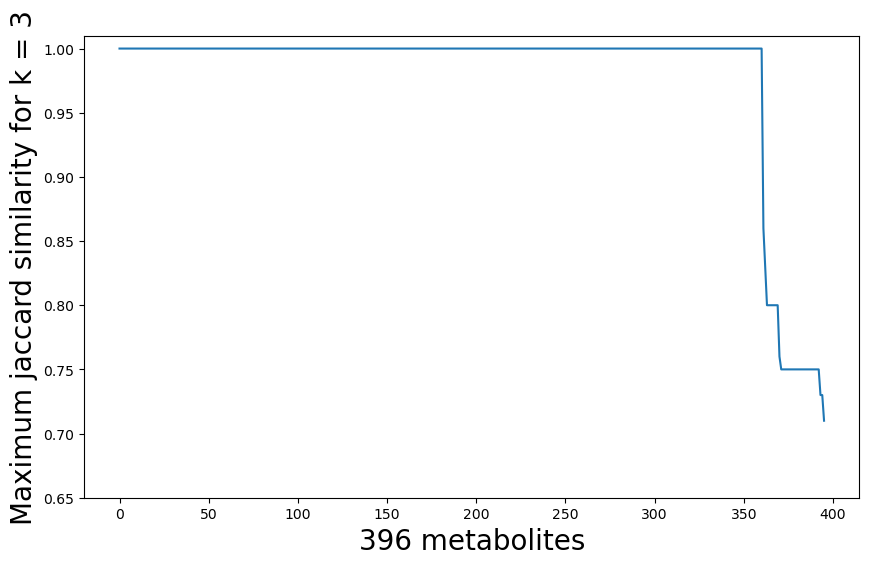

In [20]:
subset_final_df = final_df[final_df['max_jaccard'] >= 0.7]

ax = subset_final_df['max_jaccard'].plot(x='metabolite_ID',figsize=(10,6))

ax.set_ylim(0.65, 1.01)
ax.set_xlabel('%s metabolites'%len(subset_final_df['max_jaccard']),size=20)
ax.set_ylabel('Maximum jaccard similarity for k = %s'%k_value,size=20)

ax

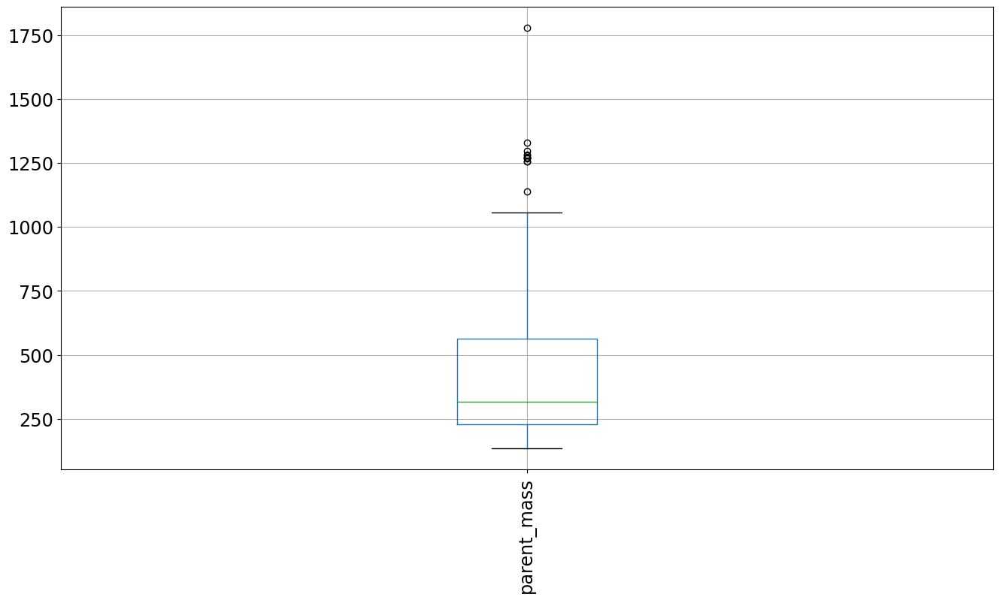

In [21]:
boxplot = pd.DataFrame(subset_final_df['parent_mass']).boxplot(figsize=[16,8],rot=90,fontsize='xx-large')

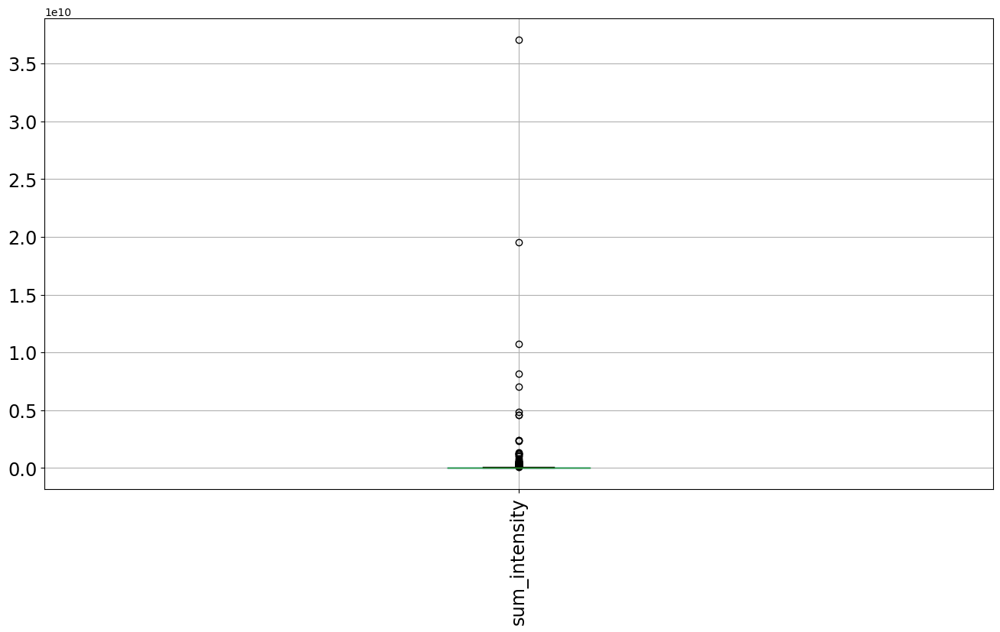

In [22]:
boxplot = pd.DataFrame(subset_final_df['sum_intensity']).boxplot(figsize=[16,8],rot=90,fontsize='xx-large')

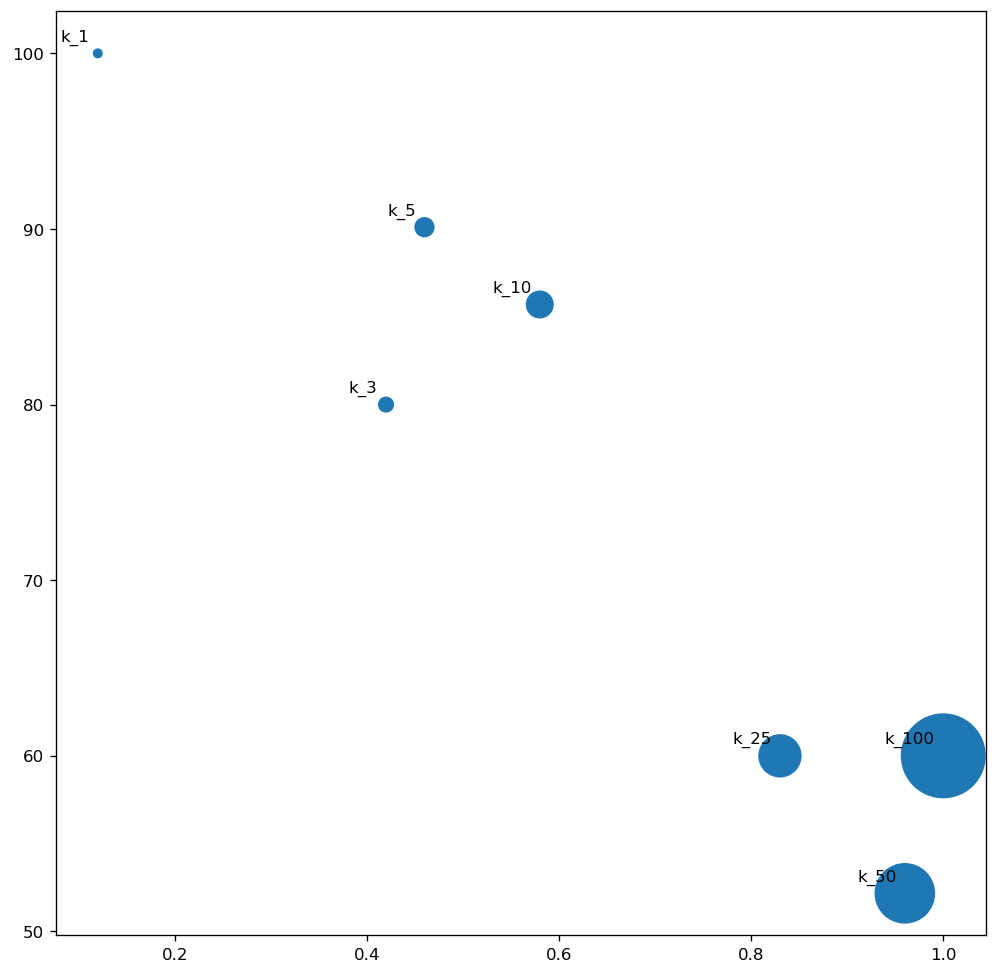

In [60]:
k_list = [1,3,5,10,25,50,100]
precision_scores = [100,80,90.1,85.7,60,52.17,60]
annotation_count = [3,10,11,14,20,23,24]
recall_list = []
for item in annotation_count:
    recall_list.append(round(item/max(annotation_count),2))
    
labels = ['k_{0}'.format(i) for i in k_list]

plt.figure(figsize=(10, 10), dpi=120)
plt.scatter(recall_list, precision_scores, s=k_list*np.repeat(25,len(k_list)))
for label, x, y in zip(labels, recall_list, precision_scores):
    plt.annotate(
        label,
        xytext=(-5,5),
        textcoords='offset points', ha='right', va='bottom',
        xy=(x, y))
plt.show()

In [24]:
# end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
run_time = "{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds)
print(run_time)

00:02:56.46
